# Analysis of Time-Point CSV Data: Microscopy Experiment with Temperature Feedback Control

This notebook provides a step-by-step tutorial for analyzing the time-point CSV data from a sophisticated microscopy experiment with real-time temperature feedback control. Each section will contain a markdown cell explaining the purpose of the code, followed by a code cell to execute the analysis step.

## Experimental Overview

This experiment involves a multi-well microscopy setup with the following key features:

### Experimental Design
- **69 wells** are monitored simultaneously using automated microscopy
- **Time-series imaging** captures cellular dynamics over extended periods
- **Multiple fluorescence channels** (C1: brightfield, C2: GFP, C3: additional fluorescence)
- **Real-time cell segmentation** using Cellpose AI for automated cell detection

### Temperature Feedback Control System
The experiment implements a closed-loop feedback system:

1. **Control Wells**: Most wells (e.g., wells 1-68) are monitored but receive no feedback
2. **Feedback Well**: One specific well (e.g., well 6) receives active temperature control
3. **Reference Well**: A control well (e.g., well 5) serves as a reference for comparison

### Feedback Loop Mechanism
1. **Image Acquisition**: Automated microscopy captures images every ~15 minutes
2. **Cell Segmentation**: Cellpose AI segments individual cells in real-time
3. **Fluorescence Analysis**: GFP intensity is measured for each segmented cell
4. **Reference Calculation**: The system calculates a reference value based on the top 20% brightest cells in the feedback well
5. **Temperature Control**: Based on the fluorescence ratio compared to baseline, the system adjusts the ambient temperature using an exponential decay function
6. **Hardware Control**: Temperature commands are sent via MQTT to a hardware controller
7. **Safety Monitoring**: The system includes SMS alerts and safety checks

### Data Structure
Each CSV file (`Time_points_dfs_XX.csv`) contains single-cell measurements with:
- **Morphological features**: cell area, shape metrics
- **Fluorescence intensities**: mean, max, min, standard deviation for each channel
- **Temporal information**: timestamps and time intervals
- **Cell counts**: number of detected cells per timepoint

This sophisticated setup allows for real-time optimization of cellular conditions based on fluorescence readouts, enabling dynamic control of biological experiments.


In [3]:
# ============================================================================
# IMPORT SECTION - All Required Libraries
# ============================================================================

# Core data manipulation and analysis
import pandas as pd
import numpy as np
import os
import random
from pathlib import Path

# Visualization libraries
import matplotlib as matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import matplotlib.colorbar as cbar
import matplotlib.patches as patches
import seaborn as sns

# Statistical analysis
from scipy.stats import wasserstein_distance, ttest_ind

# Configure matplotlib for publication-quality figures
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams['savefig.dpi'] = 300

# Set random seed for reproducibility
np.random.seed(42)
random.seed(42)

print("✓ All libraries imported successfully")
print("✓ Publication settings configured")
print("✓ Random seeds set for reproducibility")


✓ All libraries imported successfully
✓ Publication settings configured
✓ Random seeds set for reproducibility


In [4]:
# ============================================================================
# CONFIGURATION AND CONSTANTS
# ============================================================================

# Experimental parameters
HIGHLIGHT_WELL = 8  # Feedback well number
TOTAL_WELLS = 68    # Total number of wells (1-68)
ANALYSIS_START_TIME = '2024-03-15 12:00:00'
ANALYSIS_END_TIME = '2024-03-17 00:00:00'

# File paths and patterns
CSV_PATTERN = 'Time_points_dfs_{:02d}.csv'
FEEDBACK_LOG_FILE = 'Feedback_log.csv'
TEMP_DATA_PATHS = [
    r'D:\\old\\WELLS_20240313\\TEMP\\2024031312',
    r'D:\\old\\WELLS_20240313\\TEMP\\2024031800'
]

# Analysis parameters
TEMP_SAMPLING_RATE = 600  # Every 600th JSON file
RANDOM_WELLS_COUNT = 20   # Number of wells to plot for visualization
TOP_PERCENTILE = 0.8      # 80th percentile for top 20% analysis

# Visualization settings
FIGURE_SIZES = {
    'standard': (10, 6),
    'wide': (14, 6),
    'tall': (10, 8),
    'multi_panel': (12, 8),
    'population': (12, 10)
}

COLORS = {
    'control': 'green',
    'feedback': 'salmon',
    'temperature': 'blue',
    'temp_command': 'red',
    'top20': 'green',
    'bottom80': 'blue',
    'gini_control': 'green',
    'gini_feedback': 'salmon'
}

print("✓ Configuration loaded successfully")
print(f"✓ Analysis period: {ANALYSIS_START_TIME} to {ANALYSIS_END_TIME}")
print(f"✓ Feedback well: {HIGHLIGHT_WELL}")
print(f"✓ Total wells: {TOTAL_WELLS}")


✓ Configuration loaded successfully
✓ Analysis period: 2024-03-15 12:00:00 to 2024-03-17 00:00:00
✓ Feedback well: 8
✓ Total wells: 68


In [6]:
# ============================================================================
# UTILITY FUNCTIONS - Reusable Functions for Data Processing
# ============================================================================

def load_well_data(well_number, start_time=None, end_time=None):
    """
    Load and preprocess data for a specific well.
    
    Parameters:
    -----------
    well_number : int
        Well number to load
    start_time : str, optional
        Start time for filtering data
    end_time : str, optional
        End time for filtering data
        
    Returns:
    --------
    pd.DataFrame : Processed well data
    """
    try:
        filename = CSV_PATTERN.format(well_number)
        data = pd.read_csv(filename)
        data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
        
        # Filter by time if provided
        if start_time and end_time:
            start_time = pd.to_datetime(start_time)
            end_time = pd.to_datetime(end_time)
            data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
            data['hours_since_start'] = (data['Time_Stamp'] - start_time).dt.total_seconds() / 3600
            
        return data
    except FileNotFoundError:
        print(f"Warning: Could not find data for well {well_number}")
        return pd.DataFrame()

def normalize_data(data):
    """Z-score normalization: (data - mean) / std"""
    return (data - np.mean(data)) / np.std(data)

def zero_center(data, baseline_series):
    """Center data around the first value of baseline series"""
    return data - baseline_series.iloc[0]

def gini_coefficient(x):
    """
    Calculate the Gini coefficient for inequality measurement.
    
    Parameters:
    -----------
    x : array-like
        Array of values (e.g., fluorescence intensities)
    
    Returns:
    --------
    float : Gini coefficient (0 = perfect equality, 1 = maximum inequality)
    """
    x = np.array(x)
    x = x[~np.isnan(x)]
    if len(x) == 0:
        return np.nan
    
    sorted_x = np.sort(x)
    n = len(sorted_x)
    cumsum = np.cumsum(sorted_x)
    gini = (2 * np.sum((np.arange(1, n + 1) * sorted_x))) / (n * cumsum[-1]) - (n + 1) / n
    return gini

def safe_emd_calculation(ts1, ts2):
    """
    Safely calculate Earth Mover's Distance between two time series.
    
    Parameters:
    -----------
    ts1, ts2 : array-like
        Time series data for comparison
        
    Returns:
    --------
    float : EMD value or np.nan if calculation fails
    """
    try:
        if len(ts1) > 0 and len(ts2) > 0:
            return wasserstein_distance(ts1, ts2)
        else:
            return np.nan
    except Exception as e:
        print(f"EMD calculation failed: {e}")
        return np.nan

def create_publication_figure(figsize, title=None):
    """
    Create a figure with publication-ready settings.
    
    Parameters:
    -----------
    figsize : tuple
        Figure size (width, height)
    title : str, optional
        Figure title
        
    Returns:
    --------
    fig, ax : matplotlib figure and axis objects
    """
    fig, ax = plt.subplots(figsize=figsize)
    if title:
        ax.set_title(title, fontsize=16, fontweight='bold')
    return fig, ax

print("✓ Utility functions loaded successfully")
print("✓ Available functions: load_well_data, normalize_data, zero_center, gini_coefficient, safe_emd_calculation")


✓ Utility functions loaded successfully
✓ Available functions: load_well_data, normalize_data, zero_center, gini_coefficient, safe_emd_calculation


## 1. Visualizing Raw GFP Fluorescence Data Across All Wells

This first analysis step creates a comprehensive overview of the GFP fluorescence intensity (`mean_F_C2`) across all wells over time. This visualization is crucial for:

- **Identifying the feedback well**: Well 8 is highlighted in salmon color to distinguish it from the control wells
- **Comparing dynamics**: All other wells (1-67) are plotted in green to show the baseline behavior without temperature feedback
- **Detecting experimental effects**: Any differences between the feedback well and control wells become immediately apparent
- **Quality control**: Identifying any wells with unusual behavior or data collection issues

The plot shows individual cell measurements over time, providing a raw data view before any aggregation or statistical analysis. The timestamp format allows us to see the precise temporal evolution of fluorescence in each well throughout the experiment.


In [7]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

well_numbers = range(1, 68)
highlight_well = 8

# Plot all wells except the highlighted one
for well_number in well_numbers:
    if well_number != highlight_well:  # Skip the highlight well in this loop
        filename = f'Time_points_dfs_{str(well_number).zfill(2)}.csv'
        data = pd.read_csv(filename)
        data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
        sns.lineplot(x=data['Time_Stamp'], y=data['mean_F_C2'], color='g')

# Plot only the highlighted well
filename = f'Time_points_dfs_{str(highlight_well).zfill(2)}.csv'
data = pd.read_csv(filename)
data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
sns.lineplot(x=data['Time_Stamp'], y=data['mean_F_C2'], color='Salmon')

# Add a red vertical dashed line at a specific time point (uncomment and adjust the timestamp as needed)
# specific_timestamp = pd.Timestamp('2023-06-15 23:53:15')
# plt.axvline(x=specific_timestamp, color='red', linestyle='--')

plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'Time_points_dfs_01.csv'

## 2. Loading Temperature Data from JSON Files

This section loads and processes temperature monitoring data that was recorded during the experiment. The temperature data is crucial for understanding the feedback control system's performance and correlating temperature changes with cellular responses.

**Key aspects of this code:**

- **Multiple data sources**: The code can handle temperature data from multiple time periods or experimental phases
- **Data sampling**: Only every 600th JSON file is loaded to reduce data volume while maintaining temporal resolution
- **JSON parsing**: Each temperature measurement file contains sensor readings including chip temperature, setpoints, and control parameters
- **Data aggregation**: All temperature measurements are combined into a single DataFrame for analysis

The resulting `data_temp` DataFrame will contain time-series temperature measurements that can be correlated with the cellular fluorescence data to evaluate the effectiveness of the feedback control system.


In [ ]:
import os

# create a list to store the JSON files
json_files = []

pathes = [r'D:\\old\\WELLS_20240313\\TEMP\\2024031312',r'D:\\old\\WELLS_20240313\\TEMP\\2024031800']

for p in pathes:
    # set the path for the folder that contains the JSON files
    path = p

    # loop through the folder and add every 60th JSON file to the list
    for i, filename in enumerate(os.listdir(path)):
        if filename.endswith('.json') and (i+1) % 600 == 0:
            json_files.append(os.path.join(path, filename))

    # loop through the list and load each
    
data = pd.DataFrame()

for f_name in json_files:
    num = f_name.split('-')
    print(f_name)
    df = pd.read_json(f_name, lines=True)
    data = data.append(df)

# data = data.drop('Date',axis=1)
data_temp = data.reset_index(drop=True)
# data = data.astype(float)


## 3. Combined Visualization: Temperature and Fluorescence Data

This analysis creates a dual-axis plot that overlays temperature control data with cellular fluorescence measurements. This combined visualization is essential for validating the feedback control system and understanding the relationship between temperature changes and cellular responses.

**Key features of this visualization:**

- **Dual y-axes**: Left axis shows GFP fluorescence intensity, right axis shows chip temperature in Celsius
- **Random sampling**: Plots 20 randomly selected wells to reduce visual clutter while maintaining representative coverage
- **Feedback well highlighting**: Well 8 (feedback well) is still highlighted in salmon color for easy identification
- **Temporal correlation**: Both datasets are plotted on the same time axis to reveal correlations between temperature control and fluorescence changes
- **Sanity check**: This plot serves as a quality control step to ensure both datasets are properly aligned temporally and that the feedback system is responding appropriately

The resulting plot should show how temperature adjustments (blue line) correlate with changes in cellular fluorescence, particularly in the feedback well, validating that the control system is working as intended.


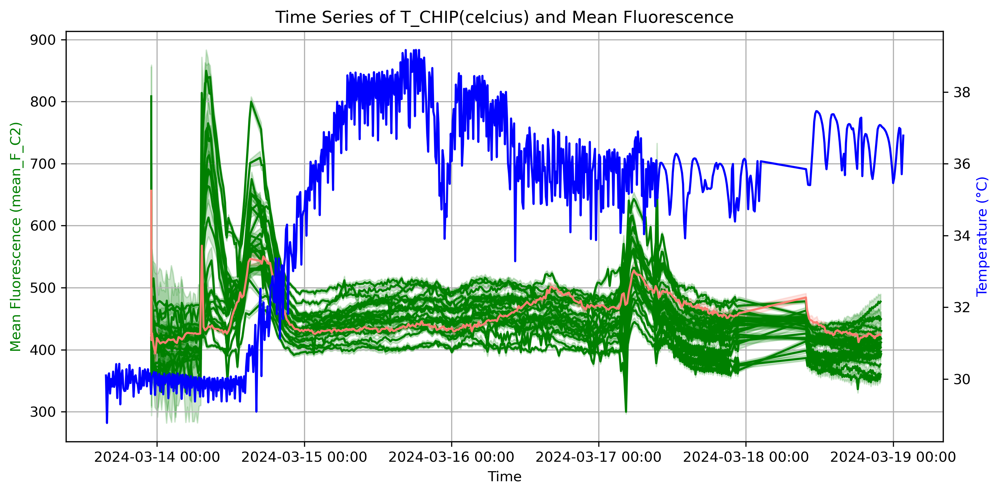

In [6]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import random

# Importing the necessary libraries
import matplotlib.dates as mdates

# Data loading and preprocessing
well_numbers = random.sample(range(1, 69), 20)
highlight_well = 8

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(figsize=(10, 5))

# Loop to plot all wells except the highlighted one
for well_number in well_numbers:
    if well_number != highlight_well:  # Skip the highlighted well in this loop
        filename = f'Time_points_dfs_{str(well_number).zfill(2)}.csv'
        data = pd.read_csv(filename)
        data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
        sns.lineplot(x=data['Time_Stamp'], y=data['mean_F_C2'], color='green', ax=ax1)

# Plot only the highlighted well
filename = f'Time_points_dfs_{str(highlight_well).zfill(2)}.csv'
data = pd.read_csv(filename)
data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
sns.lineplot(x=data['Time_Stamp'], y=data['mean_F_C2'], color='salmon', ax=ax1)

# Set labels and title for the left y-axis
ax1.set_ylabel('Mean Fluorescence (mean_F_C2)', color='g')
ax1.set_xlabel('Time')
ax1.set_title('Time Series of T_CHIP(celcius) and Mean Fluorescence')
ax1.grid(True)

# Creating a second y-axis for the temperature data
ax2 = ax1.twinx()

data_temp['Time_Stamp'] = pd.to_datetime(data_temp['Date'], format='%Y%m%d-%H%M%S')
sns.lineplot(x=data_temp['Time_Stamp'], y=data_temp['T_CHIP(celcius)'], color='blue', ax=ax2)

# Set labels for the right y-axis
ax2.set_ylabel('Temperature (°C)', color='b')

# Optionally, add a red vertical dashed line at a specific time point (uncomment and adjust the timestamp as needed)
# specific_timestamp = pd.Timestamp('2023-06-15 23:53:15')
# ax1.axvline(x=specific_timestamp, color='red', linestyle='--')

# Adjusting x-axis date format for better visibility
ax1.xaxis.set_major_locator(mdates.AutoDateLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()


## 4. Normalized Time Series Analysis with Feedback Control Commands

This analysis performs data normalization and focuses on a specific time window to analyze the relationship between cellular fluorescence and the actual temperature commands sent to the control system. This is a critical analysis for understanding the feedback loop's performance.

**Mathematical Framework:**

**Z-score Normalization:**
For each well $w$ and measurement $i$:
$$Z_{w,i} = \frac{F_{w,i} - \mu_w}{\sigma_w}$$

Where:
- $F_{w,i}$ = original fluorescence measurement
- $\mu_w = \frac{1}{N} \sum_{i=1}^{N} F_{w,i}$ = mean fluorescence for well $w$
- $\sigma_w = \sqrt{\frac{1}{N-1} \sum_{i=1}^{N} (F_{w,i} - \mu_w)^2}$ = standard deviation for well $w$
- $Z_{w,i}$ = normalized fluorescence (mean=0, std=1)

**Zero-centering (Baseline Correction):**
For temporal analysis, we apply an additional centering step:
$$F_{centered}(t) = F_{normalized}(t) - F_{normalized}(t_0)$$

Where $t_0$ is the initial timepoint, ensuring all trajectories start at zero.

**Time-based Aggregation:**
For each timepoint $t$, multiple cell measurements are aggregated:
$$\bar{F}_w(t) = \frac{1}{N_t} \sum_{i \in \text{cells at time } t} F_{w,i}(t)$$

**Key features of this analysis:**

- **Time window selection**: Focuses on a specific experimental period (March 15-17, 2024) for detailed analysis
- **Data normalization**: Uses Z-score normalization to standardize fluorescence measurements across wells, making comparisons meaningful
- **Zero-centering**: Centers the data around the initial timepoint to highlight changes over time
- **Feedback log integration**: Loads and displays the actual temperature commands (`Temp_sent`) sent to the hardware controller
- **Publication-ready formatting**: Sets font types for PDF compatibility and saves the figure as a PDF
- **Dual-axis visualization**: Shows normalized GFP fluorescence (left axis) and temperature commands (right axis)

**Normalization Benefits:**
1. **Z-score normalization**: Removes absolute scale differences between wells, enabling direct comparison of temporal dynamics
2. **Zero-centering**: Highlights relative changes from baseline, making it easier to identify treatment effects
3. **Time-based grouping**: Reduces noise by averaging multiple cell measurements per timepoint

**Biological Interpretation:**
- **Positive values**: Fluorescence above the initial baseline
- **Negative values**: Fluorescence below the initial baseline  
- **Slope changes**: Rate of fluorescence change in response to temperature control
- **Amplitude differences**: Magnitude of response between feedback and control wells

This dual normalization approach enables quantitative comparison of cellular responses to feedback control across different wells and experimental conditions.


Well number 65
Well number 4
Well number 26
Well number 54
Well number 29
Well number 64
Well number 38
Well number 18
Well number 52
Well number 56
Well number 1
Well number 49
Well number 60
Well number 11
Well number 45
Well number 28
Well number 22
Well number 61
Well number 10
Well number 14


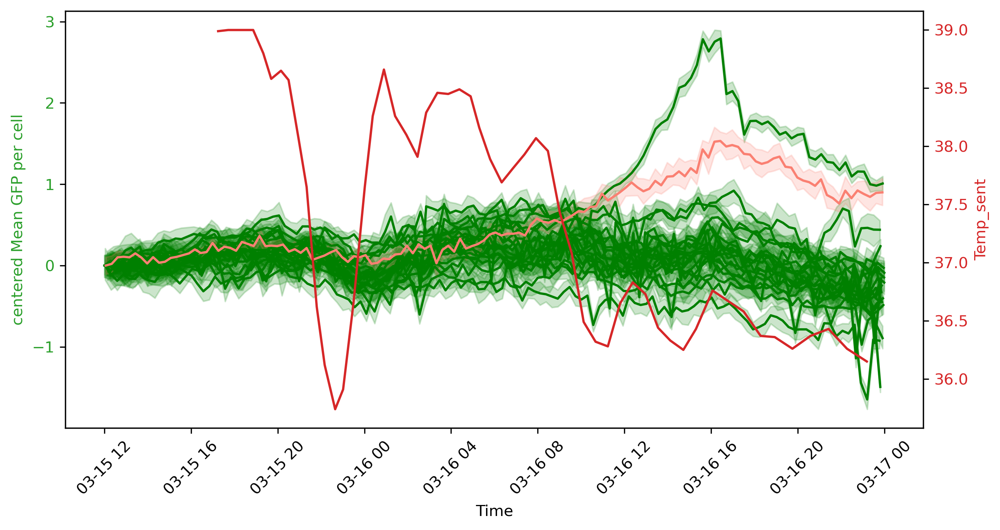

In [7]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import random
import matplotlib

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Define start and end times
start_time = pd.to_datetime('2024-03-15 12:00:00')
end_time = pd.to_datetime('2024-03-17 00:00:00')

# Loading the feedback log CSV file
Feed_back_df = pd.read_csv('Feedback_log.csv')
Feed_back_df['Time'] = pd.to_datetime(Feed_back_df['Time'], format='%m/%d/%Y %H:%M')
Feed_back_df = Feed_back_df[(Feed_back_df['Time'] >= start_time) & (Feed_back_df['Time'] <= end_time)]

# Function to normalize data
def normalize_data(data):
    return (data - np.mean(data)) / np.std(data)

def Zero_set(data, data_1):
    return data - data_1.iloc[0]

# Assuming well data is already processed
# Initialize your figure and axes
# Create a figure and a set of subplots
fig, ax1 = plt.subplots(figsize=(10, 5))
# Color for the first plot
color = 'tab:green'
ax1.set_xlabel('Time')
ax1.set_ylabel('centered Mean GFP per cell', color=color)

# Plot all wells except the highlighted one
well_numbers = random.sample(range(1, 69), 20)
highlight_well = 8

for well_number in well_numbers:
    if well_number != highlight_well:  # Skip the highlight well in this loop
        filename = f'Time_points_dfs_{str(well_number).zfill(2)}.csv'
        data = pd.read_csv(filename)
        data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
        data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
        
        # Normalize data
        data['mean_F_C2'] = normalize_data(data['mean_F_C2'])
        data_1 = data.groupby('Time_Stamp').mean_F_C2.mean().reset_index()
        data['mean_F_C2'] = Zero_set(data['mean_F_C2'],data_1['mean_F_C2'])

        # Calculate rolling mean
        # data['Rolling_Mean_F_C2'] = data['mean_F_C2'].rolling(window=5).mean()
        sns.lineplot(ax=ax1, x=data['Time_Stamp'], y=data['mean_F_C2'], color='g')
        print('Well number '+str(well_number))

# Plot only the highlighted well
filename = f'Time_points_dfs_{str(highlight_well).zfill(2)}.csv'
data = pd.read_csv(filename)
data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]

# Normalize data
data['mean_F_C2'] = normalize_data(data['mean_F_C2'])
data_1 = data.groupby('Time_Stamp').mean_F_C2.mean().reset_index()
data['mean_F_C2'] = Zero_set(data['mean_F_C2'],data_1['mean_F_C2'])

# Calculate rolling mean
# data['Rolling_Mean_F_C2'] = data['mean_F_C2'].rolling(window=5).mean()
sns.lineplot(ax=ax1, x=data['Time_Stamp'], y=data['mean_F_C2'], color='Salmon')
ax1.tick_params(axis='y', labelcolor=color)

# Rotate x-axis ticks
plt.xticks(rotation=45)

# Create a second Y-axis for the temperature sentiment plot
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Temp_sent', color=color)
sns.lineplot(ax=ax2, x='Time', y='Temp_sent', data=Feed_back_df, color=color)
ax2.tick_params(axis='y', labelcolor=color)

plt.savefig('Learning_my_figure.pdf', format='pdf', bbox_inches='tight')

# Show plot
plt.show()


## 5. Advanced Multi-Panel Visualization: GFP Time Series vs. Measured Temperature

This sophisticated analysis creates a multi-panel figure that compares cellular fluorescence dynamics with the actual measured chip temperature, providing a comprehensive view of the feedback control system's performance. This visualization is essential for understanding the relationship between temperature control commands and actual temperature measurements.

**Key features of this advanced visualization:**

- **Multi-panel layout**: Uses `gridspec` to create a stacked layout with shared x-axis for temporal alignment
- **Time normalization**: Converts all timestamps to "hours since start" for easier interpretation
- **Temperature visualization**: Shows both commanded temperature (dashed line) and actual measured temperature (colored scatter plot)
- **Color mapping**: Uses a coolwarm colormap to visualize temperature variations in the measured data
- **Separate colorbar**: Creates an independent colorbar figure for publication flexibility
- **Publication formatting**: Optimized font sizes, labels, and layout for scientific publication

**Analysis components:**
1. **Top panel**: Normalized and centered GFP fluorescence traces for control wells (green) and feedback well (salmon)
2. **Bottom panel**: Actual measured chip temperature (colored scatter) overlaid with commanded temperature (black dashed line)
3. **Independent colorbar**: Separate figure showing the temperature color scale

This visualization reveals:
- How well the actual temperature follows the commanded temperature
- The temporal relationship between temperature changes and cellular responses
- The effectiveness of the feedback control system in maintaining desired conditions
- Any delays or discrepancies between commanded and measured temperatures


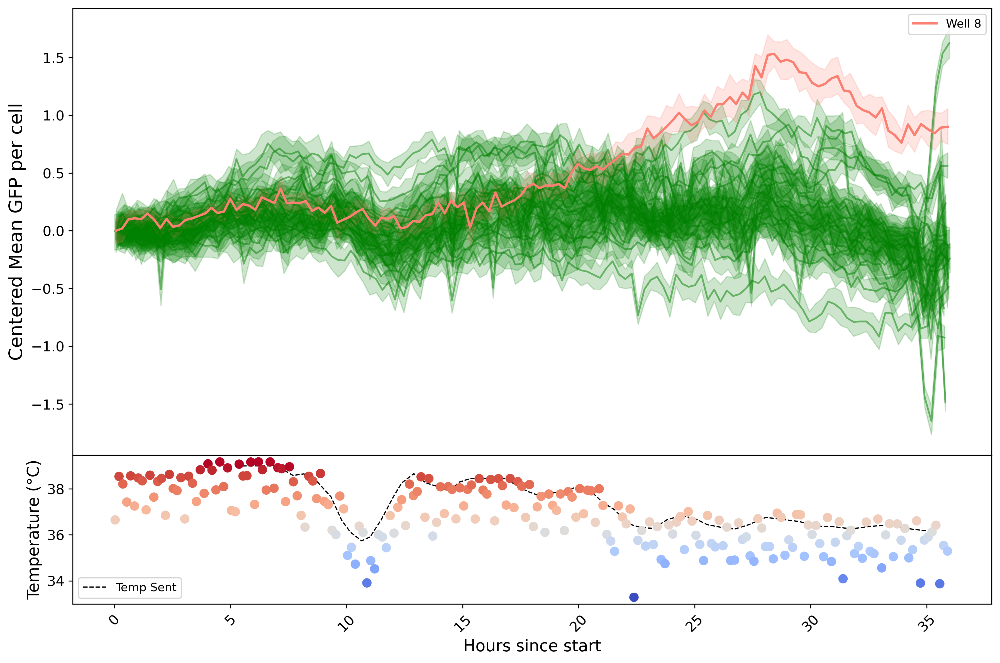

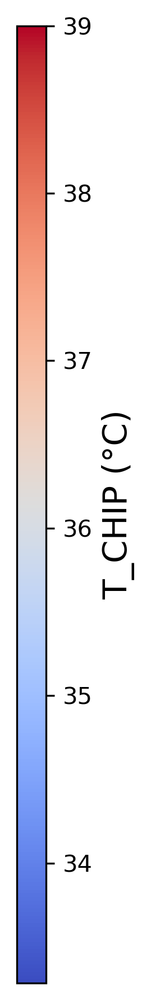

In [8]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import random
import matplotlib
import matplotlib.gridspec as gridspec

# Embed fonts in exported PDFs
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Define time window
start_time = pd.to_datetime('2024-03-15 12:00:00')
end_time   = pd.to_datetime('2024-03-17 00:00:00')

# Load feedback log
feedback_df = pd.read_csv('Feedback_log.csv')
feedback_df['Time'] = pd.to_datetime(feedback_df['Time'], format='%m/%d/%Y %H:%M')
feedback_df = feedback_df[(feedback_df['Time'] >= start_time) & (feedback_df['Time'] <= end_time)]
feedback_df = feedback_df.sort_values('Time')
feedback_df['hours_since_start'] = (feedback_df['Time'] - start_time).dt.total_seconds() / 3600

# Load real chip temperature data
data_temp['Date'] = pd.to_datetime(data_temp['Date'])
data_temp = data_temp[(data_temp['Date'] >= start_time) & (data_temp['Date'] <= end_time)]
data_temp['hours_since_start'] = (data_temp['Date'] - start_time).dt.total_seconds() / 3600

# Normalization functions
def normalize_data(data):
    return (data - np.mean(data)) / np.std(data)

def zero_set(data, baseline):
    return data - baseline.iloc[0]

# ---- Create figure ----
fig = plt.figure(figsize=(12, 8))
gs = gridspec.GridSpec(2, 1, height_ratios=[3, 1], hspace=0)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], sharex=ax1)

# Plot GFP traces
highlight_well = 8
all_wells = list(range(1, 69))
random_wells = random.sample([w for w in all_wells if w != highlight_well], 20)

for well in random_wells:
    filename = f'Time_points_dfs_{str(well).zfill(2)}.csv'
    data = pd.read_csv(filename)
    data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
    data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
    data['hours_since_start'] = (data['Time_Stamp'] - start_time).dt.total_seconds() / 3600
    data['mean_F_C2'] = normalize_data(data['mean_F_C2'])
    baseline = data.groupby('Time_Stamp')['mean_F_C2'].mean().reset_index()['mean_F_C2']
    data['mean_F_C2'] = zero_set(data['mean_F_C2'], baseline)
    sns.lineplot(x=data['hours_since_start'], y=data['mean_F_C2'], ax=ax1, color='green', alpha=0.5)

# Highlight well 8
filename = f'Time_points_dfs_{highlight_well:02d}.csv'
data = pd.read_csv(filename)
data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
data['hours_since_start'] = (data['Time_Stamp'] - start_time).dt.total_seconds() / 3600
data['mean_F_C2'] = normalize_data(data['mean_F_C2'])
baseline = data.groupby('Time_Stamp')['mean_F_C2'].mean().reset_index()['mean_F_C2']
data['mean_F_C2'] = zero_set(data['mean_F_C2'], baseline)
sns.lineplot(x=data['hours_since_start'], y=data['mean_F_C2'], ax=ax1,
             color='salmon', lw=2, label=f'Well {highlight_well}')

ax1.set_ylabel('Centered Mean GFP per cell', fontsize=16)
ax1.legend(loc='upper right')
ax1.tick_params(labelbottom=False)

# Plot real measured temperature
lowest_temp = data_temp['T_CHIP(celcius)'].min()
sc = ax2.scatter(data_temp['hours_since_start'], data_temp['T_CHIP(celcius)'],
                 c=data_temp['T_CHIP(celcius)'], cmap='coolwarm',
                 vmin=lowest_temp, vmax=39, s=50, zorder=5)

# Add trend line of temp sent (no color mapping, plain line)
ax2.plot(feedback_df['hours_since_start'], feedback_df['Temp_sent'],
         color='black', linestyle='--', linewidth=1, label='Temp Sent')

ax2.set_ylabel('Temperature (°C)', fontsize=14)
ax2.set_xlabel('Hours since start', fontsize=14)
ax2.tick_params(axis='x', rotation=45)
ax2.legend(loc='lower left', fontsize=10)

plt.tight_layout()
ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)

# Save figure without colorbar
plt.savefig('Learning_with_Actual_Temp_Hours_WITH_TempSent_NoColorbar.pdf', format='pdf', bbox_inches='tight')
plt.show()

# ---- Create independent colorbar ----
import matplotlib.colorbar as cbar

fig_cb, ax_cb = plt.subplots(figsize=(1, 6))
norm = plt.Normalize(vmin=lowest_temp, vmax=39)
cb1 = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='coolwarm'),
                   cax=ax_cb, orientation='vertical')
cb1.set_label('T_CHIP (°C)', fontsize=14)
plt.tight_layout()
plt.savefig('Colorbar_only_TempChip.pdf', format='pdf', bbox_inches='tight')
plt.show()


## 6. Population Fraction Analysis: Top 20% vs Bottom 80% GFP Dynamics

This analysis separates cellular populations based on fluorescence intensity to understand how different cell subpopulations respond to the feedback control system. Since the feedback algorithm uses only the top 20% brightest cells for control decisions, it's crucial to analyze these populations separately.

**Mathematical Framework:**

**Population Stratification:**
For each timepoint $t$ and well $w$, cells are separated based on the 80th percentile threshold:

$$Q_{0.8}(t) = \text{quantile}_{0.8}(\{F_{i,t} : i \in \text{cells at time } t\})$$

**Population Definitions:**
- **Top 20%**: $\mathcal{T}_{20}(t) = \{i : F_{i,t} \geq Q_{0.8}(t)\}$
- **Bottom 80%**: $\mathcal{B}_{80}(t) = \{i : F_{i,t} < Q_{0.8}(t)\}$

**Population Means:**
$$\bar{F}_{\text{top20}}(t) = \frac{1}{|\mathcal{T}_{20}(t)|} \sum_{i \in \mathcal{T}_{20}(t)} F_{i,t}$$

$$\bar{F}_{\text{bottom80}}(t) = \frac{1}{|\mathcal{B}_{80}(t)|} \sum_{i \in \mathcal{B}_{80}(t)} F_{i,t}$$

**Zero-centering:**
$$\bar{F}_{\text{centered}}(t) = \bar{F}(t) - \bar{F}(t_0)$$

Where $t_0$ is the initial timepoint.

**Key features of this population-based analysis:**

- **Population stratification**: Separates cells into top 20% (brightest) and bottom 80% (dimmer) based on GFP intensity at each timepoint
- **Feedback-relevant analysis**: The top 20% panel shows the exact population used by the feedback control algorithm
- **Comparative dynamics**: Reveals whether different cell populations respond differently to temperature changes
- **Zero-centered visualization**: Shows relative changes from the initial timepoint for each population
- **Multi-panel layout**: Stacked plots with shared x-axis for direct comparison

**Analysis methodology:**
1. **Quantile-based separation**: At each timepoint, cells are sorted by GFP intensity and separated at the 80th percentile
2. **Population means**: Calculate mean GFP for each population at each timepoint
3. **Zero-centering**: Normalize each population's trajectory to start at zero
4. **Temporal tracking**: Follow how each population evolves over the experimental period

**Biological significance:**
- **Top 20% panel**: Shows the dynamics of the brightest cells that drive the feedback control decisions
- **Bottom 80% panel**: Reveals how the majority of cells respond to the temperature changes
- **Population divergence**: Identifies whether feedback control affects different cell populations differently
- **Control effectiveness**: Evaluates if the feedback system successfully modulates the target population

**Feedback Control Relevance:**
The feedback algorithm specifically uses:
$$\text{Control Signal} = f\left(\bar{F}_{\text{top20}}(t)\right)$$

This analysis directly shows how this control-relevant population behaves compared to the general cellular population.


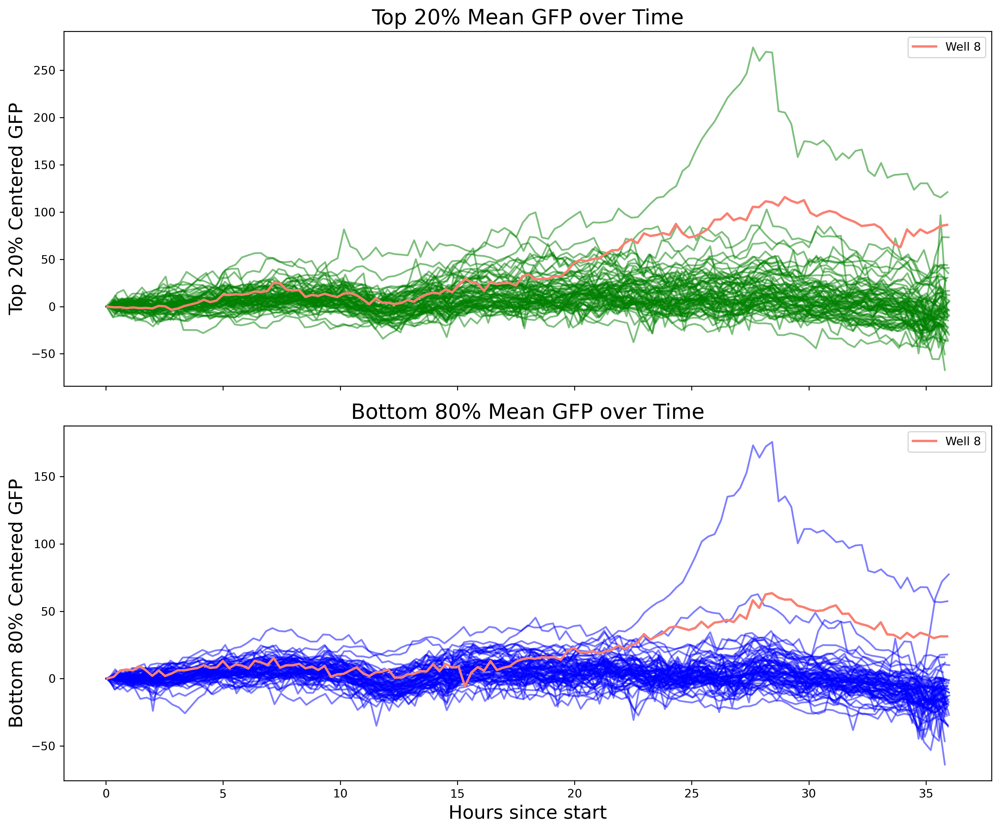

In [9]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import random
import matplotlib

# Embed fonts
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Define time window
start_time = pd.to_datetime('2024-03-15 12:00:00')
end_time   = pd.to_datetime('2024-03-17 00:00:00')

# Normalization functions
def normalize_data(data):
    return (data - np.mean(data)) / np.std(data)

def zero_set(series):
    return series - series.iloc[0]

# --- Prepare figure ---
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

highlight_well = 8
all_wells = list(range(1, 69))
random_wells = all_wells

# Top 20% plot
for well in random_wells:
    filename = f'Time_points_dfs_{str(well).zfill(2)}.csv'
    data = pd.read_csv(filename)
    data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
    data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
    data['hours_since_start'] = (data['Time_Stamp'] - start_time).dt.total_seconds() / 3600

    # Top 20% mean per timepoint
    top20_means = []
    for ts in sorted(data['hours_since_start'].unique()):
        subset = data[data['hours_since_start'] == ts]['mean_F_C2']
        threshold = subset.quantile(0.8)
        top20 = subset[subset >= threshold]
        top20_means.append(top20.mean())
    
    top20_series = pd.Series(top20_means)
    top20_series = zero_set(top20_series)
    sns.lineplot(x=sorted(data['hours_since_start'].unique()), y=top20_series, ax=ax1, color='green', alpha=0.5)

# Highlight well 8 in Top 20%
filename = f'Time_points_dfs_{highlight_well:02d}.csv'
data = pd.read_csv(filename)
data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
data['hours_since_start'] = (data['Time_Stamp'] - start_time).dt.total_seconds() / 3600

top20_means = []
for ts in sorted(data['hours_since_start'].unique()):
    subset = data[data['hours_since_start'] == ts]['mean_F_C2']
    threshold = subset.quantile(0.8)
    top20 = subset[subset >= threshold]
    top20_means.append(top20.mean())

top20_series = pd.Series(top20_means)
top20_series = zero_set(top20_series)
sns.lineplot(x=sorted(data['hours_since_start'].unique()), y=top20_series, ax=ax1, color='salmon', lw=2, label=f'Well {highlight_well}')

ax1.set_ylabel('Top 20% Centered GFP', fontsize=16)
ax1.legend(loc='upper right')
ax1.set_title('Top 20% Mean GFP over Time', fontsize=18)

# Bottom 80% plot
for well in random_wells:
    filename = f'Time_points_dfs_{str(well).zfill(2)}.csv'
    data = pd.read_csv(filename)
    data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
    data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
    data['hours_since_start'] = (data['Time_Stamp'] - start_time).dt.total_seconds() / 3600

    # Bottom 80% mean per timepoint
    bottom80_means = []
    for ts in sorted(data['hours_since_start'].unique()):
        subset = data[data['hours_since_start'] == ts]['mean_F_C2']
        threshold = subset.quantile(0.8)
        bottom80 = subset[subset < threshold]
        bottom80_means.append(bottom80.mean())
    
    bottom80_series = pd.Series(bottom80_means)
    bottom80_series = zero_set(bottom80_series)
    sns.lineplot(x=sorted(data['hours_since_start'].unique()), y=bottom80_series, ax=ax2, color='blue', alpha=0.5)

# Highlight well 8 in Bottom 80%
filename = f'Time_points_dfs_{highlight_well:02d}.csv'
data = pd.read_csv(filename)
data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
data['hours_since_start'] = (data['Time_Stamp'] - start_time).dt.total_seconds() / 3600

bottom80_means = []
for ts in sorted(data['hours_since_start'].unique()):
    subset = data[data['hours_since_start'] == ts]['mean_F_C2']
    threshold = subset.quantile(0.8)
    bottom80 = subset[subset < threshold]
    bottom80_means.append(bottom80.mean())

bottom80_series = pd.Series(bottom80_means)
bottom80_series = zero_set(bottom80_series)
sns.lineplot(x=sorted(data['hours_since_start'].unique()), y=bottom80_series, ax=ax2, color='salmon', lw=2, label=f'Well {highlight_well}')

ax2.set_ylabel('Bottom 80% Centered GFP', fontsize=16)
ax2.set_xlabel('Hours since start', fontsize=16)
ax2.legend(loc='upper right')
ax2.set_title('Bottom 80% Mean GFP over Time', fontsize=18)

plt.tight_layout()
plt.savefig('Top20_Bottom80_GFP_over_time.pdf', format='pdf', bbox_inches='tight')
plt.show()


## 7. Gini Index Analysis: Measuring Cellular Fluorescence Inequality

The Gini index is a statistical measure of inequality commonly used in economics, but highly valuable for analyzing cellular heterogeneity in biological systems. In this context, it quantifies how unequally GFP fluorescence is distributed among cells within each well at each timepoint.

**Mathematical Definition:**

The Gini coefficient $G$ for a dataset of $n$ values $x_1, x_2, ..., x_n$ (sorted in ascending order) is calculated as:

$$G = \frac{2 \sum_{i=1}^{n} i \cdot x_i}{n \sum_{i=1}^{n} x_i} - \frac{n+1}{n}$$

Alternative formulation using the Lorenz curve:
$$G = \frac{A}{A + B}$$

Where $A$ is the area between the line of perfect equality and the Lorenz curve, and $B$ is the area under the Lorenz curve.

**Key features of Gini index analysis:**

- **Inequality measurement**: Gini index ranges from 0 (perfect equality - all cells have identical fluorescence) to 1 (maximum inequality - one cell has all the fluorescence)
- **Population heterogeneity**: Reveals how feedback control affects cellular population homogeneity vs heterogeneity
- **Temporal dynamics**: Shows how fluorescence inequality evolves over time in response to temperature control
- **Control vs feedback comparison**: Compares population inequality between control wells and the feedback well

**Biological significance:**
- **Low Gini index** ($G \approx 0$): Indicates a homogeneous population with similar fluorescence levels
- **High Gini index** ($G \approx 1$): Indicates a heterogeneous population with large differences in fluorescence between cells
- **Changing Gini index**: Shows whether feedback control increases or decreases population heterogeneity over time

**Feedback control implications:**
- If feedback control reduces Gini index: The system promotes population homogeneity
- If feedback control increases Gini index: The system may be creating or maintaining population diversity
- Stable Gini index: Population structure remains consistent despite temperature changes


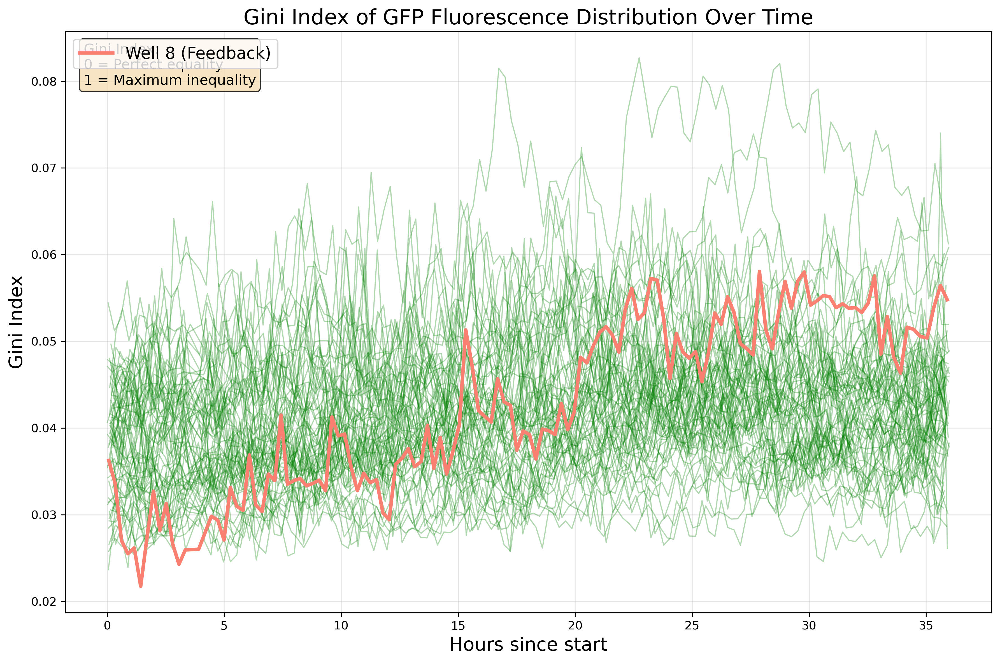

=== Gini Index Summary Statistics ===
Analysis period: 2024-03-15 12:00 to 2024-03-17 00:00
Feedback well: 8
Number of control wells analyzed: 67

Gini Index interpretation:
- Values close to 0: Homogeneous population (similar fluorescence)
- Values close to 1: Heterogeneous population (large fluorescence differences)
- Changes over time: Evolution of population structure


In [10]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib

# Embed fonts
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Define time window (same as previous analysis)
start_time = pd.to_datetime('2024-03-15 12:00:00')
end_time   = pd.to_datetime('2024-03-17 00:00:00')

def gini_coefficient(x):
    """
    Calculate the Gini coefficient of a numpy array.
    The Gini coefficient measures inequality in a distribution.
    
    Parameters:
    x : array-like
        Array of values (e.g., fluorescence intensities)
    
    Returns:
    float : Gini coefficient (0 = perfect equality, 1 = maximum inequality)
    """
    # Remove NaN values and sort
    x = np.array(x)
    x = x[~np.isnan(x)]
    if len(x) == 0:
        return np.nan
    
    # Sort values
    sorted_x = np.sort(x)
    n = len(sorted_x)
    
    # Calculate Gini coefficient using the formula:
    # G = (2 * sum(i * x_i)) / (n * sum(x_i)) - (n + 1) / n
    cumsum = np.cumsum(sorted_x)
    gini = (2 * np.sum((np.arange(1, n + 1) * sorted_x))) / (n * cumsum[-1]) - (n + 1) / n
    
    return gini

# Prepare figure
fig, ax = plt.subplots(figsize=(12, 8))

highlight_well = 8
all_wells = list(range(1, 69))

# Calculate Gini index for all wells
for well in all_wells:
    filename = f'Time_points_dfs_{str(well).zfill(2)}.csv'
    
    try:
        data = pd.read_csv(filename)
        data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
        data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
        data['hours_since_start'] = (data['Time_Stamp'] - start_time).dt.total_seconds() / 3600
        
        # Calculate Gini coefficient for each timepoint
        gini_values = []
        time_points = []
        
        for ts in sorted(data['hours_since_start'].unique()):
            subset = data[data['hours_since_start'] == ts]['mean_F_C2']
            if len(subset) > 1:  # Need at least 2 values to calculate Gini
                gini_val = gini_coefficient(subset.values)
                gini_values.append(gini_val)
                time_points.append(ts)
        
        # Plot the data
        if well == highlight_well:
            # Highlight the feedback well
            plt.plot(time_points, gini_values, color='salmon', linewidth=3, 
                    label=f'Well {highlight_well} (Feedback)', zorder=5)
        else:
            # Control wells
            plt.plot(time_points, gini_values, color='green', alpha=0.3, linewidth=1)
    
    except (FileNotFoundError, pd.errors.EmptyDataError):
        print(f"Could not load data for well {well}")
        continue

# Formatting
ax.set_xlabel('Hours since start', fontsize=16)
ax.set_ylabel('Gini Index', fontsize=16)
ax.set_title('Gini Index of GFP Fluorescence Distribution Over Time', fontsize=18)
ax.grid(True, alpha=0.3)
ax.legend(fontsize=14)

# Add text box explaining Gini index
textstr = 'Gini Index:\n0 = Perfect equality\n1 = Maximum inequality'
props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
ax.text(0.02, 0.98, textstr, transform=ax.transAxes, fontsize=12,
        verticalalignment='top', bbox=props)

plt.tight_layout()
plt.savefig('Gini_Index_Analysis.pdf', format='pdf', bbox_inches='tight')
plt.show()

# Calculate and display summary statistics
print("=== Gini Index Summary Statistics ===")
print(f"Analysis period: {start_time.strftime('%Y-%m-%d %H:%M')} to {end_time.strftime('%Y-%m-%d %H:%M')}")
print(f"Feedback well: {highlight_well}")
print(f"Number of control wells analyzed: {len(all_wells) - 1}")
print("\nGini Index interpretation:")
print("- Values close to 0: Homogeneous population (similar fluorescence)")
print("- Values close to 1: Heterogeneous population (large fluorescence differences)")
print("- Changes over time: Evolution of population structure")


🔄 Computing comprehensive EMD distance matrix...
This may take a few minutes as we calculate pairwise distances between all wells...
✓ Completed well 1
✓ Completed well 2
✓ Completed well 3
✓ Completed well 4
✓ Completed well 5
✓ Completed well 6
✓ Completed well 7
✓ Completed well 8
✓ Completed well 9
✓ Completed well 10
✓ Completed well 11
✓ Completed well 12
✓ Completed well 13
✓ Completed well 14
✓ Completed well 15
✓ Completed well 16
✓ Completed well 17
✓ Completed well 18
✓ Completed well 19
✓ Completed well 20
✓ Completed well 21
✓ Completed well 22
✓ Completed well 23
✓ Completed well 24
✓ Completed well 25
✓ Completed well 26
✓ Completed well 27
✓ Completed well 28
✓ Completed well 29
✓ Completed well 30
✓ Completed well 31
✓ Completed well 32
✓ Completed well 33
✓ Completed well 34
✓ Completed well 35
✓ Completed well 36
✓ Completed well 37
✓ Completed well 38
✓ Completed well 39
✓ Completed well 40
✓ Completed well 41
✓ Completed well 42
✓ Completed well 43
✓ Completed well

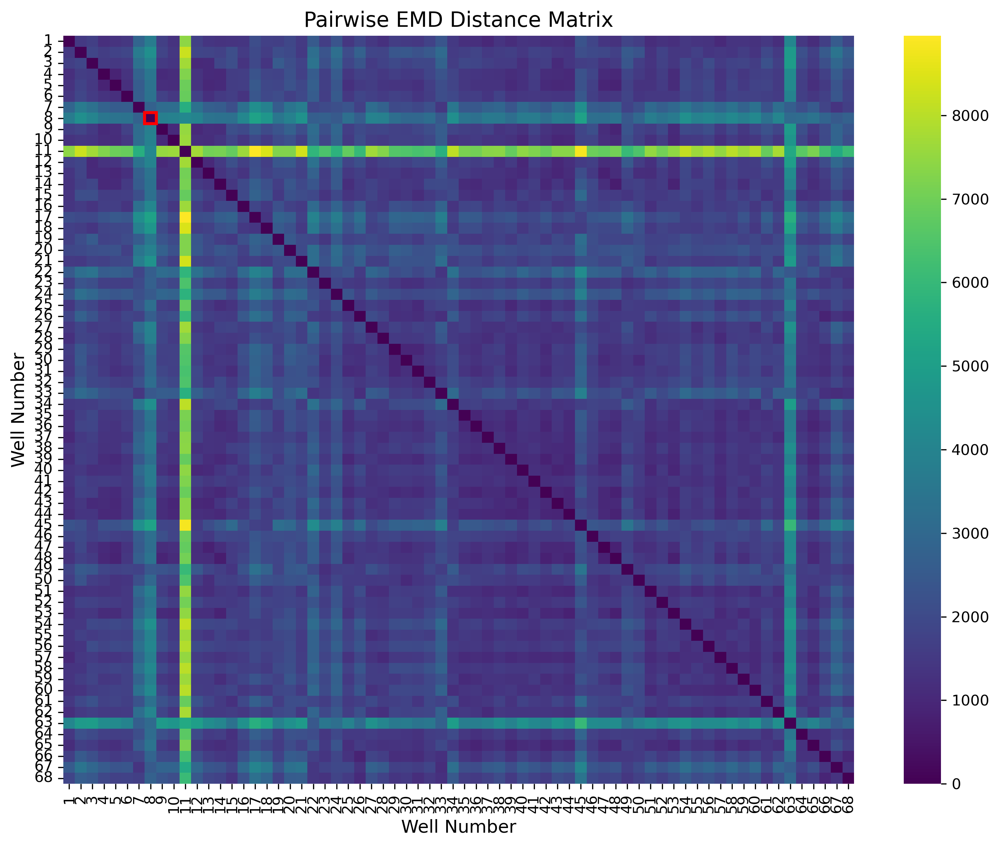


🎉 EMD analysis complete!
✓ Processed 68 wells
✓ Generated 68×68 distance matrix
✓ Data saved in 'Aggregate_wells' DataFrame for further analysis


In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as patches
from scipy.stats import wasserstein_distance

# Define start and end times
start_time = '2024-03-15 12:00:00'
end_time   = '2024-03-17 00:00:00'

def Zero_set(data, data_1):
    return data - data_1.iloc[0]

def EMD_timepoints(well):
    highlight_well = well
    highlight_filename = f'Time_points_dfs_{str(highlight_well).zfill(2)}.csv'
    highlight_data = pd.read_csv(highlight_filename)
    highlight_data['Time_Stamp'] = pd.to_datetime(highlight_data['Time_Stamp'], format='%Y%m%d-%H%M%S')
    highlight_data = highlight_data[(highlight_data['Time_Stamp'] >= start_time) & (highlight_data['Time_Stamp'] <= end_time)]
    data_1 = highlight_data.groupby('Time_Stamp').mean_F_C2.mean().reset_index()
    highlight_data['mean_F_C2'] = Zero_set(highlight_data['mean_F_C2'], data_1['mean_F_C2'])
    
    Strat_Time_interval = highlight_data['Time_interval'].min()
    End_Time_interval = highlight_data['Time_interval'].max()
    
    EMD_dist = []
    for well_number in range(1, 69):
        filename = f'Time_points_dfs_{str(well_number).zfill(2)}.csv'
        try:
            data = pd.read_csv(filename)
            data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
            data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
            data_1 = data.groupby('Time_Stamp').mean_F_C2.mean().reset_index()
            data['mean_F_C2'] = Zero_set(data['mean_F_C2'], data_1['mean_F_C2'])
            
            EMD_dist_per_Time_point = []
            for Time_point in range(Strat_Time_interval, End_Time_interval+1):
                Timepoint_ts1 = highlight_data[highlight_data['Time_interval'] == Time_point]['mean_F_C2']
                Timepoint_ts2 = data[data['Time_interval'] == Time_point]['mean_F_C2']
                try:
                    emd = wasserstein_distance(Timepoint_ts1, Timepoint_ts2)
                    EMD_dist_per_Time_point.append(emd)
                except Exception:
                    pass
            EMD_dist.append(sum(EMD_dist_per_Time_point))
        except FileNotFoundError:
            print(f"Warning: Could not find data for well {well_number}")
            EMD_dist.append(0)  # Add placeholder value
    return EMD_dist

# --- Aggregate the results ---
print("🔄 Computing comprehensive EMD distance matrix...")
print("This may take a few minutes as we calculate pairwise distances between all wells...")

Aggregate_wells = pd.DataFrame(columns=['wells'])
Aggregate_wells['wells'] = range(1, 69)

for well in range(1, 69):
    try:
        col = EMD_timepoints(well)
        Aggregate_wells[f'Well_{well}_EMD'] = col
        print(f'✓ Completed well {well}')
    except Exception as e:
        print(f'⚠ Error processing well {well}: {e}')
        # Add placeholder column with zeros
        Aggregate_wells[f'Well_{well}_EMD'] = [0] * 68

# Convert aggregated results into a distance matrix
# Rows are wells (reference wells) and columns are the computed EMD distances to all wells
distance_matrix = Aggregate_wells.drop('wells', axis=1).to_numpy()

# --- Plot the distance matrix heatmap ---
plt.figure(figsize=(10, 8))
ax = sns.heatmap(distance_matrix, cmap='viridis', xticklabels=range(1, 69), yticklabels=range(1, 69))
ax.set_title('Pairwise EMD Distance Matrix', fontsize=14)
ax.set_xlabel('Well Number', fontsize=12)
ax.set_ylabel('Well Number', fontsize=12)

# Highlight well 8 (index 7 in 0-indexing)
rect = patches.Rectangle((7, 7), 1, 1, linewidth=2, edgecolor='red', facecolor='none')
ax.add_patch(rect)

plt.tight_layout()
plt.savefig('EMD_heatmap_readable.pdf', format='pdf', bbox_inches='tight')
plt.show()

print(f"\n🎉 EMD analysis complete!")
print(f"✓ Processed {len(Aggregate_wells)} wells")
print(f"✓ Generated {distance_matrix.shape[0]}×{distance_matrix.shape[1]} distance matrix")
print(f"✓ Data saved in 'Aggregate_wells' DataFrame for further analysis")


## 8. Earth Mover's Distance (EMD) Analysis: Comprehensive Pairwise Well Comparison

The Earth Mover's Distance (EMD), also known as the Wasserstein distance, is a powerful metric for comparing probability distributions. This analysis creates a comprehensive 68×68 distance matrix showing the distribution of distances per well throughout the experiment, providing insights into population dynamics and identifying clusters of similar behavioral patterns.

**Mathematical Definition:**

The Earth Mover's Distance between two distributions $P$ and $Q$ is defined as:

$$W_p(P, Q) = \left( \inf_{\gamma \in \Pi(P,Q)} \int_{\mathcal{X} \times \mathcal{Y}} d(x,y)^p \, d\gamma(x,y) \right)^{1/p}$$

For the 1-Wasserstein distance (used in this analysis):
$$W_1(P, Q) = \inf_{\gamma \in \Pi(P,Q)} \int_{\mathcal{X} \times \mathcal{Y}} |x-y| \, d\gamma(x,y)$$

Where:
- $\Pi(P,Q)$ is the set of all joint distributions with marginals $P$ and $Q$
- $d(x,y)$ is the ground distance (typically $|x-y|$ for 1D data)
- $\gamma$ represents the optimal transport plan

**Computational Implementation:**

For discrete distributions with samples $\{x_i\}$ and $\{y_j\}$:
$$EMD = \min_{\gamma} \sum_{i,j} \gamma_{ij} |x_i - y_j|$$

Subject to: $\sum_j \gamma_{ij} = \frac{1}{n}, \sum_i \gamma_{ij} = \frac{1}{m}$

**Key features of this comprehensive EMD analysis:**

- **Complete pairwise comparison**: Calculates EMD between every pair of wells (68×68 matrix) to capture all possible relationships
- **Temporal aggregation**: For each well pair, sums EMD values across all timepoints to measure overall experimental similarity
- **Distribution of distances**: Shows how each well's fluorescence distribution differs from all other wells throughout the experiment
- **Zero-centered normalization**: Uses the same normalization as previous analyses for consistency and comparability

**Analysis methodology:**
1. **Reference well selection**: Each well serves as a reference, comparing its distribution to all other wells
2. **Timepoint-by-timepoint comparison**: EMD calculated at each time interval between the reference well and every other well
3. **Temporal integration**: Sum of EMD values across all timepoints gives total dissimilarity measure
4. **Matrix construction**: Results organized into a symmetric distance matrix for visualization

**Normalization Process:**
For each well $w$ and timepoint $t$:
$$X_{w,t}^{normalized} = X_{w,t} - \bar{X}_{w,t_0}$$

Where $\bar{X}_{w,t_0}$ is the mean fluorescence at the initial timepoint.

**Visualization features:**
- **Heatmap representation**: Color-coded matrix where darker colors indicate higher dissimilarity
- **Well 8 highlighting**: Red border highlights the feedback well (well 8) for easy identification
- **Symmetric matrix**: Distance from well A to well B equals distance from well B to well A
- **Diagonal interpretation**: Diagonal elements show self-comparison (should be near zero)

**Biological interpretation:**
- **Low EMD values (dark blue)**: Wells with very similar fluorescence distribution patterns
- **High EMD values (bright yellow)**: Wells with very different population dynamics
- **Clustering patterns**: Groups of wells with similar colors indicate behavioral clusters
- **Feedback well analysis**: Row and column 8 show how the feedback well compares to all controls


## 9. Temporal EMD Analysis: Distribution of Distances from Feedback Well Over Time

This analysis provides a temporal perspective on how the feedback well (well 8) differs from all other wells throughout the experiment. Instead of aggregating EMD values across time, this analysis examines the distribution of EMD distances at each individual timepoint, revealing how the feedback effect evolves over time.

**Key features of this temporal EMD analysis:**

- **Timepoint-specific analysis**: Calculates EMD between well 8 and all other wells at each individual timepoint
- **Distribution visualization**: Shows the spread of EMD values using box plots to reveal variability in well-to-well differences
- **Temporal evolution**: Tracks how the feedback well's distinctiveness changes over the course of the experiment
- **Statistical insights**: Box plots reveal median, quartiles, and outliers in the EMD distributions

**Analysis methodology:**
1. **Target well selection**: Focuses specifically on well 8 (the feedback well) as the reference
2. **Timepoint iteration**: For each time interval, compares well 8's distribution to every other well
3. **EMD calculation**: Uses Wasserstein distance to measure distribution differences at each timepoint
4. **Statistical aggregation**: Collects all EMD values for each timepoint to show the distribution

**Box plot interpretation:**
- **Box center (median)**: Typical EMD value between well 8 and other wells at that timepoint
- **Box edges (quartiles)**: 25th and 75th percentiles of EMD values
- **Whiskers**: Range of EMD values (excluding outliers)
- **Outliers**: Wells that are exceptionally similar or different from well 8

**Biological significance:**
- **Increasing EMD over time**: Feedback control is making well 8 progressively more different from controls
- **Decreasing EMD over time**: Feedback effect may be diminishing or controls are adapting
- **Stable EMD**: Consistent feedback effect maintained throughout experiment
- **High variability**: Some control wells respond differently to the experimental conditions

**Feedback control insights:**
- **Onset timing**: When does the feedback well start becoming distinguishable from controls?
- **Effect magnitude**: How large are the differences between feedback and control wells?
- **Temporal stability**: Does the feedback effect remain consistent or change over time?
- **Population heterogeneity**: Are all control wells equally different from the feedback well?


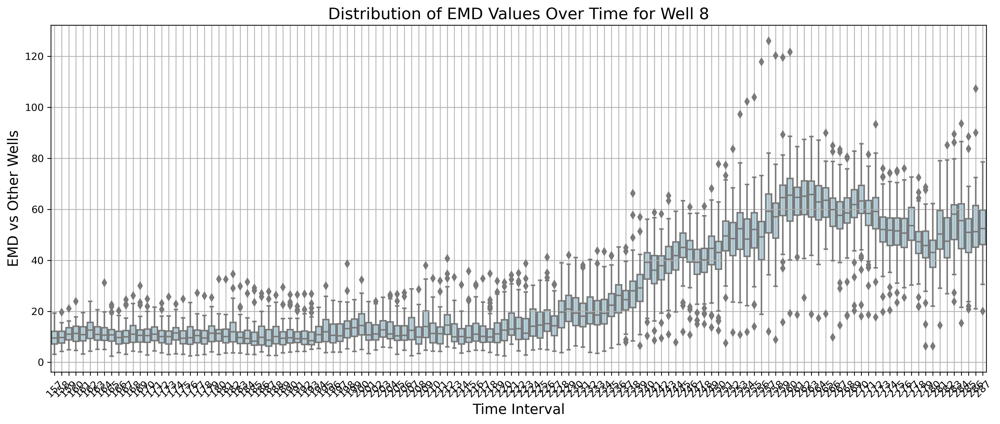

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import wasserstein_distance

# Define start and end times
start_time = '2024-03-15 12:00:00'
end_time   = '2024-03-17 00:00:00'

# Helper functions
def Zero_set(data, baseline_series):
    return data - baseline_series.iloc[0]

# Function to calculate EMD vs all wells at each timepoint
def EMD_vs_all_timepoints(target_well):
    highlight_filename = f'Time_points_dfs_{str(target_well).zfill(2)}.csv'
    highlight_data = pd.read_csv(highlight_filename)
    highlight_data['Time_Stamp'] = pd.to_datetime(highlight_data['Time_Stamp'], format='%Y%m%d-%H%M%S')
    highlight_data = highlight_data[(highlight_data['Time_Stamp'] >= start_time) & (highlight_data['Time_Stamp'] <= end_time)]
    baseline = highlight_data.groupby('Time_Stamp')['mean_F_C2'].mean().reset_index()['mean_F_C2']
    highlight_data['mean_F_C2'] = Zero_set(highlight_data['mean_F_C2'], baseline)

    start_interval = highlight_data['Time_interval'].min()
    end_interval = highlight_data['Time_interval'].max()

    # Prepare dictionary to hold EMDs per timepoint
    emd_timepoint_dict = {tp: [] for tp in range(start_interval, end_interval+1)}

    for well_number in range(1, 69):
        if well_number == target_well:
            continue  # skip self-comparison

        filename = f'Time_points_dfs_{str(well_number).zfill(2)}.csv'
        data = pd.read_csv(filename)
        data['Time_Stamp'] = pd.to_datetime(data['Time_Stamp'], format='%Y%m%d-%H%M%S')
        data = data[(data['Time_Stamp'] >= start_time) & (data['Time_Stamp'] <= end_time)]
        baseline = data.groupby('Time_Stamp')['mean_F_C2'].mean().reset_index()['mean_F_C2']
        data['mean_F_C2'] = Zero_set(data['mean_F_C2'], baseline)

        for tp in range(start_interval, end_interval+1):
            ts1 = highlight_data[highlight_data['Time_interval'] == tp]['mean_F_C2']
            ts2 = data[data['Time_interval'] == tp]['mean_F_C2']
            try:
                emd = wasserstein_distance(ts1, ts2)
                emd_timepoint_dict[tp].append(emd)
            except Exception:
                continue

    return emd_timepoint_dict

# --- Compute EMD vs all other wells over time for Well 8 ---
emd_dict = EMD_vs_all_timepoints(target_well=8)

# Convert to DataFrame for seaborn boxplot
emd_df = pd.DataFrame([
    {'Time_interval': timepoint, 'EMD': value}
    for timepoint, emds in emd_dict.items()
    for value in emds
])

# --- Plot ---
plt.figure(figsize=(14, 6))
sns.boxplot(x='Time_interval', y='EMD', data=emd_df, color='lightblue')
plt.xlabel('Time Interval', fontsize=14)
plt.ylabel('EMD vs Other Wells', fontsize=14)
plt.title('Distribution of EMD Values Over Time for Well 8', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.savefig('EMD_boxplot_well8.pdf', format='pdf', bbox_inches='tight')
plt.show()


## 10. Statistical Comparison: Feedback Well vs Control Population Distribution

This final analysis provides a direct statistical comparison between the feedback well (well 8) and the control population by comparing the distribution of EMD distances. This analysis tests whether the feedback control system creates statistically significant differences in population dynamics compared to the natural variation among control wells.

**Key features of this comparative analysis:**

- **Population-level comparison**: Compares the distribution of EMD distances from well 8 to all other wells versus the mean EMD distances between control wells
- **Statistical testing**: Uses a two-sample t-test to determine if the differences are statistically significant
- **Visual comparison**: Side-by-side box plots show the distribution differences clearly
- **Effect size visualization**: Shows both statistical significance and practical magnitude of differences

**Analysis methodology:**
1. **Control well means**: Calculate the mean EMD distance for each control well to all other wells
2. **Feedback well distances**: Extract EMD distances from well 8 to all other wells
3. **Statistical comparison**: Perform two-sample t-test with unequal variances (Welch's t-test)
4. **Visualization**: Create comparative box plots with statistical annotations

**Statistical interpretation:**
- **p-value < 0.05**: Feedback well is significantly different from control population
- **p-value ≥ 0.05**: No statistically significant difference detected
- **Effect size**: Magnitude of difference between the distributions (visual inspection of box plots)
- **Distribution shape**: Variance and skewness differences between groups

**Box plot comparison:**
- **Left box (green)**: Distribution of mean EMD distances among control wells
- **Right box (salmon)**: Distribution of EMD distances from feedback well to all others
- **Position differences**: Higher values indicate greater dissimilarity
- **Spread differences**: Variance in how different wells behave

**Biological significance:**
- **Significant difference**: Feedback control creates measurably distinct population dynamics
- **Large effect size**: Feedback well behaves very differently from typical well-to-well variation
- **Small effect size**: Feedback effect is detectable but modest compared to natural variation
- **No significance**: Feedback effect is within the range of natural experimental variation

**Experimental validation:**
- **Positive control**: Confirms feedback system is working and creating detectable effects
- **Effect magnitude**: Quantifies how much the feedback changes population behavior
- **System sensitivity**: Tests whether the analysis methods can detect the intended experimental manipulation


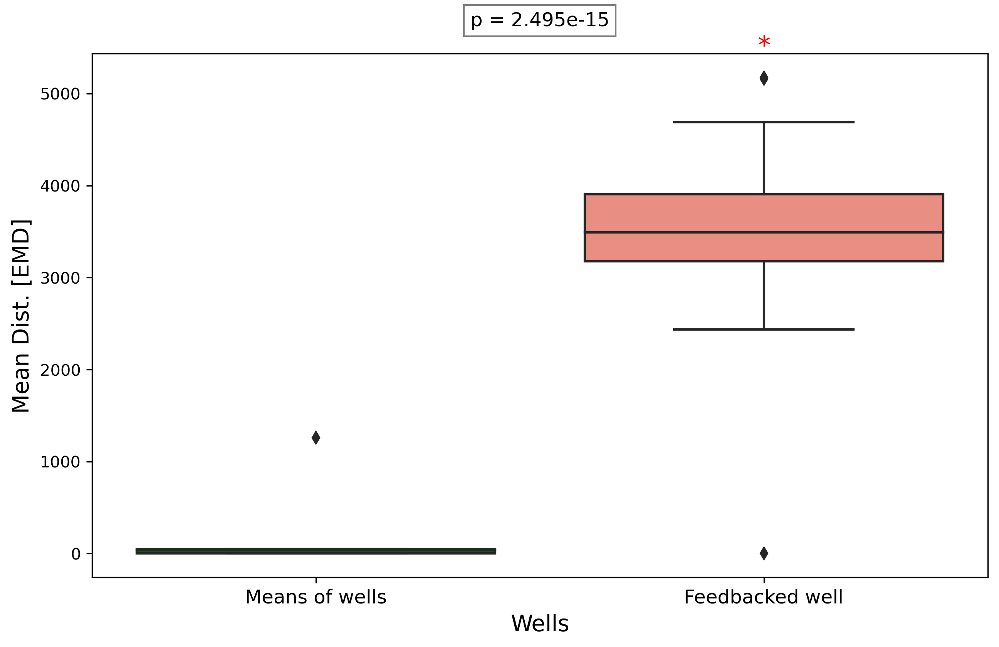

In [16]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import ttest_ind

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Assuming df and Aggregate_wells are already defined in your workspace

# Calculate the mean of each column (excluding Well_8_EMD)
means = df.mean()  # df should contain the EMD values for all wells except Well_8_EMD
# Convert means to a DataFrame (each value becomes one observation)
means_only_df = pd.DataFrame({'Value': means, 'Column': 'Means'}).reset_index(drop=True)

# Create a DataFrame for Well_8_EMD from Aggregate_wells
well_8_emd_df = Aggregate_wells[['Well_8_EMD']].melt(value_name='Value')
well_8_emd_df['Column'] = 'Well_8_EMD'

# Concatenate the two DataFrames to form the data for boxplots
combined_df = pd.concat([means_only_df, well_8_emd_df], axis=0)

# Define colors for the box plots: green for Means, salmon for Well_8_EMD
colors = ['green', 'salmon']

plt.figure(figsize=(10, 6))
ax = sns.boxplot(x='Column', y='Value', data=combined_df, palette=colors)
plt.xlabel('Wells', fontsize=14)
plt.ylabel('Mean Dist. [EMD]', fontsize=14)
plt.xticks(ticks=[0, 1], labels=['Means of wells', 'Feedbacked well'], fontsize=12)

# Calculate the p-value comparing the two groups using a two-sample t-test
pval = ttest_ind(means_only_df['Value'], well_8_emd_df['Value'], equal_var=False).pvalue

# Annotate the p-value in a text box at the top center of the plot
y_max = combined_df['Value'].max()
plt.text(0.5, y_max + 0.1 * abs(y_max), f'p = {pval:.3e}',
         horizontalalignment='center', verticalalignment='bottom',
         fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

# Place an asterisk above the Well_8_EMD box plot (x-position 1)
well8_max = well_8_emd_df['Value'].max()
plt.text(1, well8_max + 0.05 * abs(well8_max), '*',
         horizontalalignment='center', fontsize=16, color='red')

plt.savefig('GT_curve.png', transparent=True)
plt.savefig('DIST.pdf', format='pdf', bbox_inches='tight')
plt.show()


## 11. Conformal Prediction Analysis: Detecting Regulatory Regime Escape

Conformal prediction provides a distribution-free method to test whether the feedback well has "escaped" the normal regulatory regime observed in control wells. This approach creates prediction intervals based on the control population and tests whether the feedback well's behavior falls outside these intervals.

**Key advantages of conformal prediction:**

- **Distribution-free**: No assumptions about data normality or specific distributions
- **Finite-sample validity**: Provides exact coverage guarantees regardless of sample size
- **Temporal anomaly detection**: Can identify when the feedback well becomes anomalous
- **Confidence quantification**: Provides calibrated uncertainty estimates

**Conformal prediction methodology:**
1. **Calibration set**: Use control wells to learn the "normal" regulatory regime
2. **Nonconformity scoring**: Define how "unusual" a well's behavior is compared to controls
3. **Prediction intervals**: Create time-varying confidence intervals for normal behavior
4. **Anomaly detection**: Test if feedback well falls outside prediction intervals

**Data requirements analysis:**
- **Minimum wells needed**: ~15-20 control wells for reliable calibration
- **Temporal resolution**: Sufficient timepoints to capture dynamics
- **Feature selection**: Choose appropriate metrics (GFP mean, variance, trends)
- **Validation strategy**: Cross-validation to assess method reliability

This analysis will help determine if the feedback control creates statistically detectable deviations from normal cellular regulatory behavior.


# timepoints in window: 131
# plotted timepoints (step=10): 14


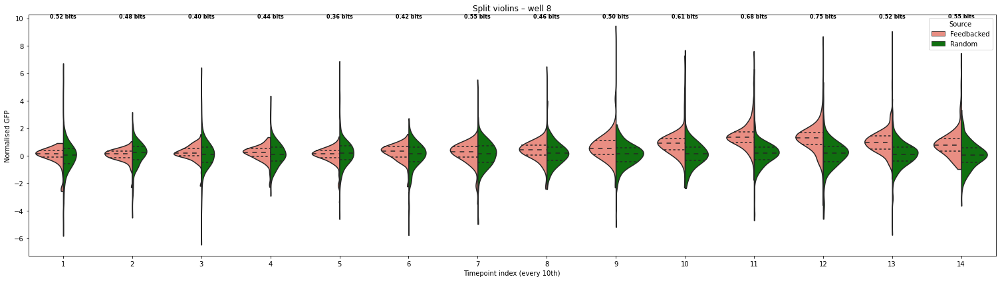

In [18]:
#!/usr/bin/env python
"""
split_violin_mi_window.py  ──────────────────────────────────────────
• Same clipping window and normalisation as the trace-plot script.
• Plot split violins (Feedbacked = salmon, Random = green) every
  TIME_STEP-th timestamp of the feedbacked well.
• “Random” side = equal-size sample drawn from *all other wells*
  inside the window (any timestamp).
• Annotate proper mutual information in bits:

        I(S;G) = H(G) − ½·[ H(G|S=FB) + H(G|S=Random) ]
                = H_joint − ½·(H_FB + H_Random)

  where entropies are computed on integer histograms over a
  global support (min→max normalised GFP) with Freedman–Diaconis bins.
"""

from pathlib import Path
from typing import List
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import entropy

# ───────────── USER SETTINGS ─────────────
DATA_DIR        = Path('.')          # folder with Time_points_dfs_*.csv
FEEDBACK_WELL   = 8                  # int, 1-based
TIME_STEP       = 10                 # every N-th timestamp
SEED            = 42                 # RNG seed
START_TIME = pd.to_datetime('2024-03-15 12:00:00')
END_TIME   = pd.to_datetime('2024-03-17 00:00:00')
# ─────────────────────────────────────────


def load_clip(fp: Path) -> pd.DataFrame:
    """Load CSV, parse time, clip to window."""
    df = pd.read_csv(fp)
    df['Time_Stamp'] = pd.to_datetime(df['Time_Stamp'],
                                      format='%Y%m%d-%H%M%S')
    return df[(df['Time_Stamp'] >= START_TIME) &
              (df['Time_Stamp'] <= END_TIME)].copy()


def normalise(df: pd.DataFrame,
              col: str = 'mean_F_C2') -> pd.DataFrame:
    """z-score, then subtract first-timestamp mean (matches trace script)."""
    df = df.copy()
    df[col] = (df[col] - df[col].mean()) / df[col].std(ddof=0)
    first_mean = df.groupby('Time_Stamp')[col].mean().iloc[0]
    df[col] -= first_mean
    return df


def fd_edges(series: pd.Series,
             fallback_bins: int = 10) -> np.ndarray:
    """Freedman–Diaconis bin edges over full data range."""
    x = series.to_numpy()
    iqr = np.subtract(*np.percentile(x, [75, 25]))
    if iqr == 0:
        return np.linspace(x.min(), x.max(), fallback_bins + 1)
    bw = 2 * iqr / (len(x) ** (1/3))
    n_bins = max(int(np.ceil((x.max() - x.min()) / bw)), 1)
    return np.linspace(x.min(), x.max(), n_bins + 1)


def shannon_H(counts: np.ndarray) -> float:
    """Shannon entropy (bits) for integer counts."""
    total = counts.sum()
    if total == 0:
        return 0.0
    probs = counts[counts > 0] / total
    return -np.sum(probs * np.log2(probs))


def main() -> None:
    rng = np.random.default_rng(SEED)

    # ── feedbacked well ──
    fb_fp = DATA_DIR / f'Time_points_dfs_{FEEDBACK_WELL:02d}.csv'
    fb = normalise(load_clip(fb_fp))
    times_fb = sorted(fb['Time_Stamp'].unique())
    print(f'# timepoints in window: {len(times_fb)}')

    # ── pool of other wells ──
    pool_files = [p for p in DATA_DIR.glob('Time_points_dfs_*.csv')
                  if p != fb_fp]
    if not pool_files:
        raise RuntimeError('No other wells found.')
    pool = pd.concat([normalise(load_clip(p)) for p in pool_files],
                     ignore_index=True)

    # global histogram support
    edges = fd_edges(pd.concat([fb['mean_F_C2'], pool['mean_F_C2']]))

    # subsample timestamps
    times_sel = times_fb[::TIME_STEP]
    print(f'# plotted timepoints (step={TIME_STEP}): {len(times_sel)}')

    records: List[dict] = []
    mi_bits = {}

    for idx, t in enumerate(times_sel, start=1):
        fb_t = fb[fb['Time_Stamp'] == t]
        n_cells = len(fb_t)

        rnd_t = pool.sample(n=n_cells,
                            replace=len(pool) < n_cells,
                            random_state=rng.integers(1e9))

        # data for violin plot
        records.extend({'GFP': g, 'Source': 'Feedbacked', 'Time': idx}
                       for g in fb_t['mean_F_C2'])
        records.extend({'GFP': g, 'Source': 'Random', 'Time': idx}
                       for g in rnd_t['mean_F_C2'])

        # entropy calc
        fb_cnt, _  = np.histogram(fb_t['mean_F_C2'], bins=edges)
        rn_cnt, _  = np.histogram(rnd_t['mean_F_C2'], bins=edges)
        jt_cnt      = fb_cnt + rn_cnt

        H_fb    = shannon_H(fb_cnt)
        H_rn    = shannon_H(rn_cnt)
        H_joint = shannon_H(jt_cnt)

        mi_bits[idx] = H_joint - 0.5 * (H_fb + H_rn)   # proper MI

    # tidy dataframe
    long_df = pd.DataFrame.from_records(records)
    long_df['Time'] = pd.Categorical(long_df['Time'],
                                     categories=sorted(mi_bits.keys()),
                                     ordered=True)

    # ── plotting ──
    palette = {'Feedbacked': 'salmon', 'Random': 'green'}
    plt.figure(figsize=(max(6, len(mi_bits) * 1.5), 6))
    ax = sns.violinplot(data=long_df,
                        x='Time', y='GFP',
                        hue='Source', split=True,
                        inner='quart', cut=0,
                        palette=palette)

    # MI annotations
    y_top = long_df['GFP'].max() * 1.05
    for cat in long_df['Time'].cat.categories:
        ax.text(int(cat) - 1, y_top,
                f'{mi_bits[int(cat)]:.2f} bits',
                ha='center', va='bottom',
                fontsize=8, weight='bold')

    ax.set_xlabel(f'Timepoint index (every {TIME_STEP}th)')
    ax.set_ylabel('Normalised GFP')
    ax.set_title(f'Split violins – well {FEEDBACK_WELL}')
    plt.tight_layout()
    plt.show()


if __name__ == '__main__':
    main()


## 12. Computational Model: Theoretical Foundation of the Feedback Control System

This final section presents the computational model that served as the theoretical foundation for designing the experimental feedback control system. The model simulates cellular population dynamics with temperature-dependent growth and GFP expression switching, providing insights into the expected behavior under feedback control.

**Model Overview:**

The computational model integrates several key biological processes:

**1. Temperature-Dependent Generation Times:**
$$t_{gen}(T) = \text{interpolation}(T, [T_{ref}], [t_{ref}])$$

Where generation time depends on temperature through empirically-derived relationships.

**2. GFP State Switching:**
The model implements a bistable GFP expression system where cells can exist in two states:
- **Low GFP state** ($GFP \approx 1$): Basal expression level
- **High GFP state** ($GFP \approx 3$): Elevated expression level

**3. Division-Time Dependent Switching Probability:**
$$P_{switch}(t_{div}) = P_{min} + (P_{max} - P_{min}) \cdot \frac{t_{div} - t_{min}}{t_{max} - t_{min}}$$

Where:
- $P_{min} = 0.015$ (minimum switching probability)
- $P_{max} = 0.4$ (maximum switching probability)
- $t_{div}$ = mother cell division time

**4. Feedback Control Function:**
$$T(t) = T_{base} + R_{temp} \cdot e^{-\overline{GFP}(t)/\gamma}$$

Where:
- $T_{base} = 30°C$ (base temperature)
- $R_{temp} = 22°C$ (temperature range)
- $\gamma = 1.1$ (decay curve parameter)
- $\overline{GFP}(t)$ = mean population GFP level

**5. Stochastic Division Process:**
$$P_{division}(\Delta t) = 1 - e^{-\alpha \cdot \Delta t / t_{gen}}$$

Where $\alpha = 0.015$ is a scale factor controlling division probability.

**Key Model Features:**

- **Population size regulation**: Moran process maintains population ≤ 1000 cells
- **Temporal dynamics**: 1-minute time steps over 1000-minute simulation
- **Feedback frequency**: Temperature updates every 30 minutes based on mean GFP
- **Stochastic processes**: Random division timing and GFP state switching
- **Realistic constraints**: Generation times range from 75-180 minutes depending on temperature

**Biological Significance:**

This model captures the essential dynamics expected in the experimental system:
- Cells with longer division times are more likely to switch GFP states
- Higher mean GFP levels trigger higher temperatures
- Higher temperatures affect cellular generation times
- The feedback loop creates complex population dynamics

**Model Validation:**

The simulation results can be compared with experimental data to:
- Validate feedback control effectiveness
- Predict optimal control parameters
- Understand population heterogeneity dynamics
- Guide experimental design decisions

This computational framework provides the theoretical foundation for interpreting the experimental results presented in the previous analyses.


     Temperature  Division Time  Generation Time  Time of Birth  \
0      38.863587            125       173.179354            125   
1      38.664345            163       163.217231            288   
2      38.739629             45       166.981434            333   
3      38.902027             55       175.101342            388   
4      38.868251            105       173.412575            393   
..           ...            ...              ...            ...   
321    35.439926            124       103.465800            998   
322    35.439926             59       103.465800            998   
323    35.439926            157       103.465800            999   
324    35.439926            230       103.465800            999   
325    35.439926             75       103.465800            999   

     Time Since Mother Division       GFP  
0                           125  1.050018  
1                           163  0.996459  
2                            45  0.934483  
3                  

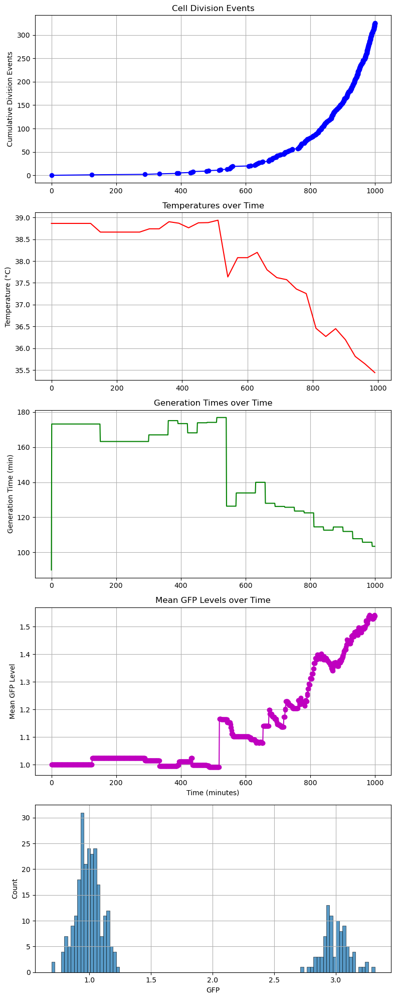

Total number of divisions: 326


In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib 

def gen_time_func(temp):
    temp_points = [30, 33, 36, 37, 38, 39]
    gen_times = [90, 75, 110, 120, 130, 180]
    return np.interp(temp, temp_points, gen_times)

def jump_prob_func(mother_division_time):
    min_division_time = 30
    max_division_time = 200
    p_jump_min = 0.015
    p_jump_max = 0.4
    
    # Ensure the mother's division time is within the specified range
    mother_division_time = max(min_division_time, min(mother_division_time, max_division_time))
    
    # Calculate the jump probability based on the mother's division time
    p_jump = p_jump_min + (p_jump_max - p_jump_min) * (mother_division_time - min_division_time) / (max_division_time - min_division_time)
    
    return p_jump

def dec_exp(x, range_Temp, base_Temp, curve):
    if x == 0:
        y_value = base_Temp + 0.5
        y_crit = (y_value - base_Temp) / range_Temp
        x_crit = -curve * np.log(y_crit)
        print('Multiplication of F needed to reach 0.5 a degree from target is: ' + str(x_crit))
    y = np.exp(-x / curve)
    return base_Temp + y * range_Temp

class Cell:
    def __init__(self, temp, time_of_birth, mother_division_time, gfp):
        self.generation_time = gen_time_func(temp)
        self.time_of_birth = time_of_birth
        self.mother_division_time = mother_division_time
        self.time_since_division = 0
        self.gfp = gfp

    def update_generation_time(self, temp):
        self.generation_time = gen_time_func(temp)

    def divide(self, time_since_division, current_time):
        scale_factor = 0.015
        p_division = 1 - np.exp(-scale_factor * time_since_division / self.generation_time)
        if np.random.random() < p_division:
            division_time = self.time_since_division
            self.time_since_division = 0
            return True, division_time, self.generation_time, current_time
        else:
            return False, None, None, None

def determine_gfp(mother_gfp, mother_division_time):
    p_jump = jump_prob_func(mother_division_time)
    if mother_gfp < 2:  # Assume X is around 1 and 3X is around 3
        if np.random.random() < p_jump:
            return 3 + np.random.normal(0, 0.1)  # Jump to 3X
        else:
            return 1 + np.random.normal(0, 0.1)  # Stay at X
    else:
        if np.random.random() < p_jump:
            return 1 + np.random.normal(0, 0.1)  # Jump to X
        else:
            return 3 + np.random.normal(0, 0.1)  # Stay at 3X

# Set the simulation time parameters
total_time = 1000  # Total simulation time in minutes
time_step = 1  # Time step for the simulation (1 minute)

# Initialize variables to store the division times, temperatures, and generation times
division_times = [0]  # Start with the initial division at time 0
temperature_history = []
temperature_times = []
generation_time_history = []
gfp_history = []
time_history = []
division_data = []

# Create the initial cell with the starting temperature and GFP level
initial_gfp = 1
initial_cell = Cell(30, 0, 0, initial_gfp)
population = [initial_cell]

# Set the reward curve parameters
range_Temp = 22
base_Temp = 30
curve = 1.1

# Run the simulation
current_time = 0
while current_time < total_time:
    # Update the temperature every 30 time points based on the mean GFP of the population
    if current_time % 30 == 0:
        mean_gfp = np.mean([cell.gfp for cell in population])
        temperature = dec_exp(mean_gfp, range_Temp, base_Temp, curve)
        temperature_history.append(temperature)
        temperature_times.append(current_time)
        
    if len(population) > 1000:
        # Randomly select a cell to remove
        index = np.random.randint(len(population))
        population.pop(index)
    
    # Store the average GFP level and generation time at each time step
    gfp_history.append(np.mean([cell.gfp for cell in population]))
    generation_time_history.append(np.mean([cell.generation_time for cell in population]))
    time_history.append(current_time)
    
    for cell in population:
        cell.update_generation_time(temperature)

        divided, division_time, gen_time, division_time_point = cell.divide(cell.time_since_division, current_time)
        if divided:
            division_times.append(current_time)
            daughter_gfp = determine_gfp(cell.gfp, cell.mother_division_time)
            new_cell = Cell(temperature, division_time_point, division_time, daughter_gfp)
            population.append(new_cell)
            division_data.append({
                'Temperature': temperature,
                'Division Time': division_time,
                'Generation Time': gen_time,
                'Time of Birth': new_cell.time_of_birth,
                'Time Since Mother Division': new_cell.mother_division_time,
                'GFP': new_cell.gfp
            })

        cell.time_since_division += time_step

    # Implement Moran process if population size exceeds 1000
    if len(population) > 1000:
        # Randomly select a cell to remove
        index = np.random.randint(len(population))
        population.pop(index)

    current_time += time_step

# Create a DataFrame with the division data
df = pd.DataFrame(division_data)

# Print the DataFrame
print(df)

# Create a figure with subplots
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(8, 20))

# Plot the division events over time
ax1.plot(division_times, np.arange(len(division_times)), 'bo-')
ax1.set_ylabel('Cumulative Division Events')
ax1.set_title('Cell Division Events')
ax1.grid(True)

# Plot the temperatures over time
ax2.plot(temperature_times, temperature_history, 'r-')
ax2.set_ylabel('Temperature (°C)')
ax2.set_title('Temperatures over Time')
ax2.grid(True)

# Plot the generation times over time
ax3.plot(time_history, generation_time_history, 'g-')
ax3.set_ylabel('Generation Time (min)')
ax3.set_title('Generation Times over Time')
ax3.grid(True)

# Plot the GFP levels over time
ax4.plot(time_history, gfp_history, 'mo-')
ax4.set_xlabel('Time (minutes)')
ax4.set_ylabel('Mean GFP Level')
ax4.set_title('Mean GFP Levels over Time')
ax4.grid(True)

sns.histplot(df['GFP'], bins=100, ax=ax5)
ax5.grid(True)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Print the total number of divisions
total_divisions = len(division_times) - 1  # Subtract 1 to exclude the initial division at time 0
print(f"Total number of divisions: {total_divisions}")
